<a href="https://colab.research.google.com/github/glaucio1973/mvp/blob/master/cats_vs_dogs_binaryclassify_um_unico_diretorio_dl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classificador de imagens binária - Gato VS Cachorro

**Contexto:** Temos um conjunto de imagens que representam duas categorias de animais: gato e cachorro. O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem em alguma das categorias mencionadas acima.

**Estrutura:** O notebook está dividido assim:

1. Importação das bibliotecas
2. Acesso e tratamento dos dados que serão a entrada do modelo de deep learning
3. Configuração do modelo de deep learning usando uma rede neural convolucional (CNN) simples com Keras
4. Treinamento do modelo de deep learning
5. Execução do modelo de deep learning treinado em um subconjunto das imagens de teste
6. Avaliação do modelo de deep learning
7. Exportação do modelo de deep learning
8. Teste do modelo exportado

**Créditos:** O notebook foi adaptado de [MARWAA SHAABAN ABD ELHAKIM](https://www.kaggle.com/code/marwaaabdalhakim/cats-vs-dogs-binaryclassify-dl) e documentado pelos professores:

- Hugo Villamizar
- Patrick Happ

**Dataset:** O dataset foi baixado do Kaggle, uma plataforma online voltada para cientistas de dados, entusiastas de aprendizado de máquina e profissionais afins. O uso é estritamente didático. Para mais informações sobre o dataset, veja o link a seguir: [gato Vs Cachorro kaggle](https://www.kaggle.com/competitions/dogs-vs-cats/data).

## 1. Importando as bibliotecas necessárias para executar o notebook

P.S. Para conseguir executar o notebook é necessário instalar bibliotecas como Tensorflow, keras, scikit-learn. Por exemplo:

`pip install tensorflow`

`pip install keras`

`pip install pandas`

`pip install scikit-learn`

In [ ]:
!pip install tensorflow
!pip install keras
!pip install pandas
!pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


#### Utilidades

`plot_confusion_matrix` é uma função python que imprime uma matriz de confusão

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

## 2. Acessando e tratando os dados que serão a entrada do modelo de deep learning

Acessando o drives das imagens e verificando suas 20 imagens aleatorias
Exemplos de algumas imagens extraídas


In [ ]:

import os
import random


diretorio = '/content/drive/MyDrive/Colab Notebooks/Imagens/train'
print(os.listdir(diretorio))
# Obtém a lista de arquivos no diretório
arquivos = os.listdir(diretorio)

# Seleciona uma amostra aleatória de 20 elementos da lista de arquivos
amostra = random.sample(arquivos, k=20)

# Exibe as primeiras 20 imagens aleatórias
print(f"Primeiras 20 imagens aleatórias:\n{amostra}")

['cat.1.jpg', 'cat.20.jpg', 'cat.21.jpg', 'cat.19.jpg', 'cat.22.jpg', 'cat.18.jpg', 'cat.17.jpg', 'cat.16.jpg', 'cat.141.jpg', 'cat.129.jpg', 'cat.128.jpg', 'cat.127.jpg', 'cat.111.jpg', 'cat.96.jpg', 'cat.126.jpg', 'cat.84.jpg', 'cat.83.jpg', 'cat.85.jpg', 'cat.82.jpg', 'cat.40.jpg', 'cat.45.jpg', 'cat.42.jpg', 'cat.44.jpg', 'cat.41.jpg', 'cat.47.jpg', 'cat.46.jpg', 'cat.39.jpg', 'cat.43.jpg', 'cat.74.jpg', 'cat.70.jpg', 'cat.73.jpg', 'cat.69.jpg', 'cat.71.jpg', 'cat.75.jpg', 'cat.54.jpg', 'cat.55.jpg', 'cat.57.jpg', 'cat.56.jpg', 'cat.15.jpg', 'cat.14.jpg', 'cat.13.jpg', 'cat.25.jpg', 'cat.24.jpg', 'cat.23.jpg', 'cat.12.jpg', 'cat.38.jpg', 'cat.81.jpg', 'cat.68.jpg', 'cat.72.jpg', 'cat.53.jpg', 'cat.11.jpg', 'cat.8.jpg', 'cat.9.jpg', 'cat.10.jpg', 'cat.4.jpg', 'cat.7.jpg', 'cat.5.jpg', 'cat.6.jpg', 'cat.3.jpg', 'cat.2.jpg', 'cat.201.jpg', 'cat.80.jpg', 'cat.79.jpg', 'cat.78.jpg', 'cat.77.jpg', 'cat.76.jpg', 'cat.63.jpg', 'cat.61.jpg', 'cat.67.jpg', 'cat.62.jpg', 'cat.65.jpg', 'cat.64

# Verificando a quantidade de imagens das duas classes no diretorio


In [ ]:


# Obtém a lista de arquivos no diretório
arquivos = os.listdir(diretorio)

# Contadores
contador_cat = 0
contador_dog = 0

# Percorre a lista de arquivos
for arquivo in arquivos:
    if arquivo.lower().startswith('cat'):
        contador_cat += 1
    elif arquivo.lower().startswith('dog'):
        contador_dog += 1

# Exibe a quantidade de arquivos
print("Quantidade de arquivos iniciados com 'cat':", contador_cat)
print("Quantidade de arquivos iniciados com 'dog':", contador_dog)

Quantidade de arquivos iniciados com 'cat': 1051
Quantidade de arquivos iniciados com 'dog': 1051


Exemplos de algumas imagens extraídas

Criando um dataframe com as informações das imagens

In [ ]:
#images =os.listdir(path)
path = '/content/drive/MyDrive/Colab Notebooks/Imagens/train/'
images = os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []
i=1;
# Loop que percorre cada uma das imagens extraídas
for fname in images:
    print('nome arqurivo: ',path+fname, '  imagem numero: ',i)
    i +=1
    #print("Altura:", heights)
    #print("Largura:", widths)
    #print("Canais:", channels)
    labels.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                        'width': widths, 'channels': channels, 'filesize': filesize})

nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.1.jpg   imagem numero:  1
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.20.jpg   imagem numero:  2
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.21.jpg   imagem numero:  3
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.19.jpg   imagem numero:  4
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.22.jpg   imagem numero:  5
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.18.jpg   imagem numero:  6
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.17.jpg   imagem numero:  7
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.16.jpg   imagem numero:  8
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.141.jpg   imagem numero:  9
nome arqurivo:  /content/drive/MyDrive/Colab Notebooks/Imagens/train/cat.129.jpg   imagem numero:  1

Visualização do dataset criado

In [ ]:
display(df)

,images,class,height,width,channels,filesize
0,cat.1.jpg,cat,400,266,3,45632
1,cat.20.jpg,cat,375,500,3,17560
2,cat.21.jpg,cat,240,320,3,10161
3,cat.19.jpg,cat,500,379,3,23301
4,cat.22.jpg,cat,371,500,3,16060
...,...,...,...,...,...,...
2097,dog.994.jpg,dog,193,200,3,7011
2098,dog.990.jpg,dog,458,500,3,22085
2099,dog.1001.jpg,dog,375,500,3,24018
2100,dog.992.jpg,dog,375,500,3,29024


Visualização do número de imagens por classe

cat    1051
dog    1051
Name: class, dtype: int64


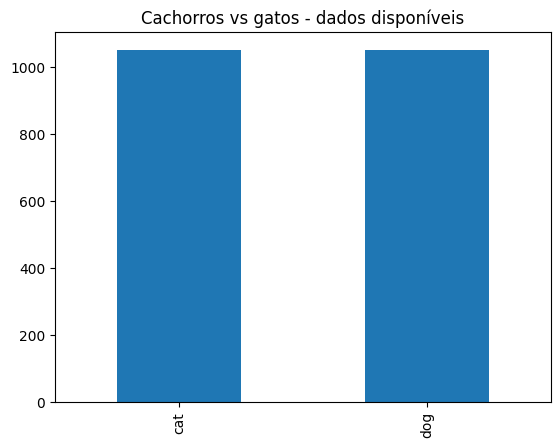

In [ ]:
print((df['class']).value_counts())
dogsVScats_count = df['class'].value_counts().plot.bar(title='Cachorros vs gatos - dados disponíveis')

Visualizando algumas imagens do conjunto de dados

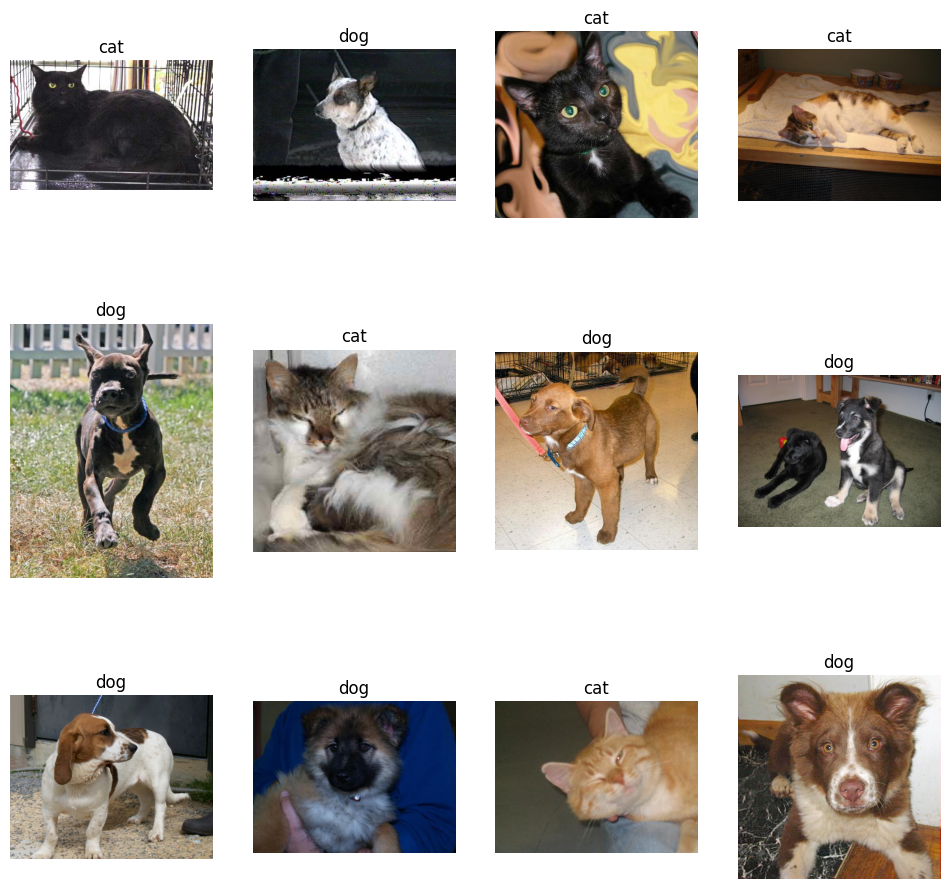

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

plt.show()

Divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [ ]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

Visualizando a divisão dos dados

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
           images class
1941  dog.313.jpg   dog
465   cat.578.jpg   cat
1559  dog.763.jpg   dog
199   cat.769.jpg   cat
1732  dog.457.jpg   dog
...           ...   ...
1638  dog.598.jpg   dog
1095    dog.5.jpg   dog
1130  dog.163.jpg   dog
1294  dog.849.jpg   dog
860   cat.351.jpg   cat

[1471 rows x 2 columns]
##### Test: #####
           images class
1868  dog.433.jpg   dog
1272  dog.911.jpg   dog
571   cat.496.jpg   cat
941   cat.995.jpg   cat
1652  dog.531.jpg   dog
...           ...   ...
1910  dog.278.jpg   dog
1664  dog.535.jpg   dog
1822  dog.356.jpg   dog
570   cat.499.jpg   cat
712   cat.327.jpg   cat

[631 rows x 2 columns]


#### Preparação dos dados

`ImageDataGenerator` é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o `ImageDataGenerator` para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método `flow_from_dataframe()` para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes), entre outros.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 1177 validated image filenames belonging to 2 classes.
Found 294 validated image filenames belonging to 2 classes.
Found 631 validated image filenames belonging to 2 classes.


Visualizando um exemplo do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


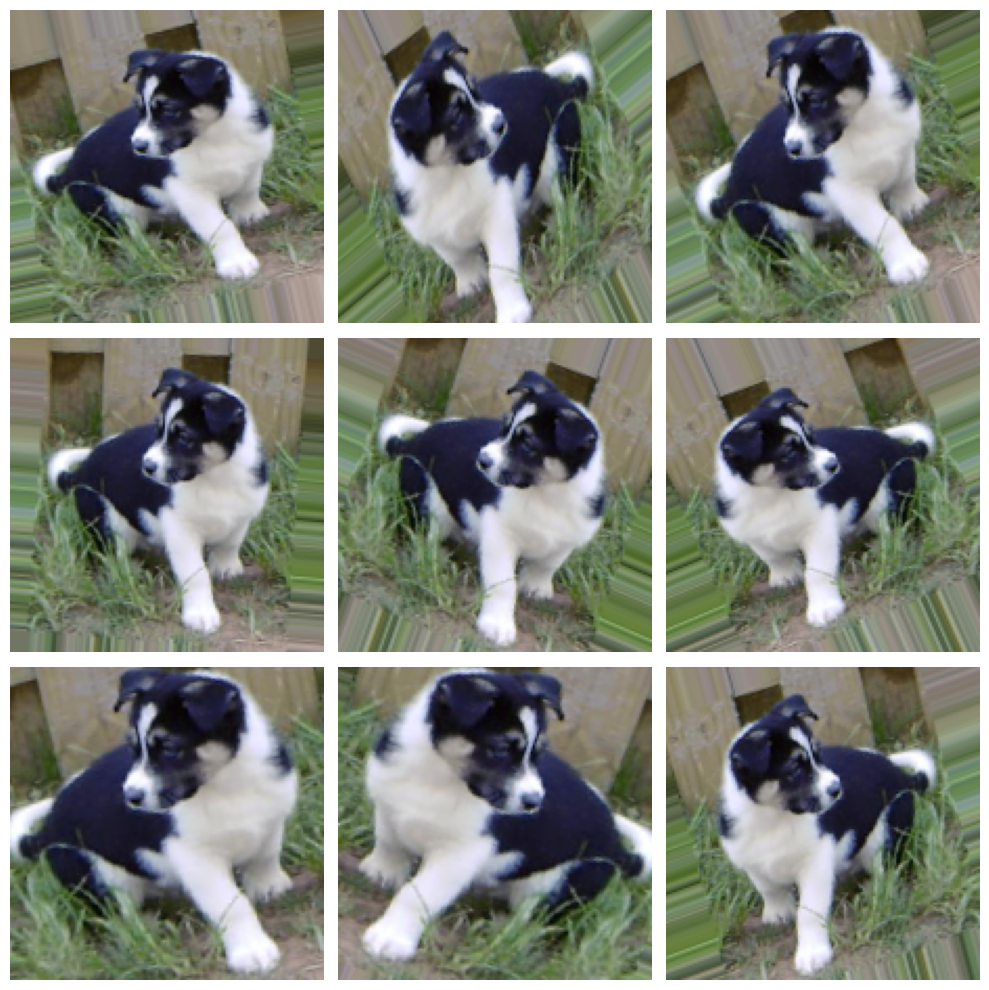

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

## 3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

#### Definição da arquitetura do modelo

Aqui é especificada uma `camada convolucional 2D` que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação `ReLU`. O parâmetro `input_shape` define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas `max-pooling` com a mesma função de ativação.

In [ ]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

## 4. Treinamento do modelo de deep learning

#### Compilação do modelo Keras com as configurações do treinamento

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='binary_crossentropy'`: especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator`.

In [49]:
history=model.fit_generator(train_generator ,
                            steps_per_epoch=50,
                            epochs=5 ,
                            validation_data=val_generator ,
                            validation_steps=50)

<ipython-input-49-55604360af2c>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator ,


Epoch 1/5
24/50 [=============>................] - ETA: 1:25 - loss: 0.6914 - accuracy: 0.5285

50/50 [==============================] - 91s 2s/step - loss: 0.6914 - accuracy: 0.5285 - val_loss: 0.6848 - val_accuracy: 0.5340


## 5. Execução do modelo treinado em um subconjunto das imagems de teste
Idealmente se deseja realizar a inferência sobre todo o conjunto de teste, porém para efeitos de agilidade, executamos apenas em um subconjunto de imagens.

2/2 [==============================] - 1s 287ms/step


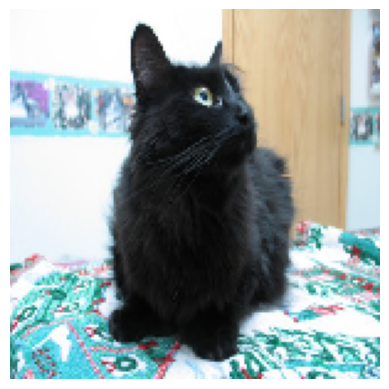

Label:  cat
Previsão:  dog
Probabilidade:  0.56470245


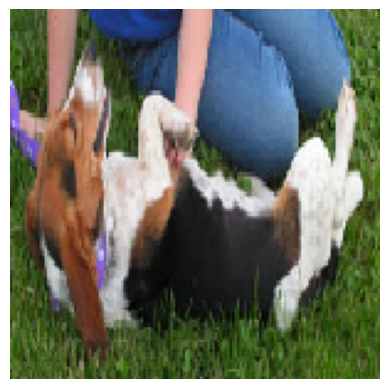

Label:  dog
Previsão:  dog
Probabilidade:  0.6121651


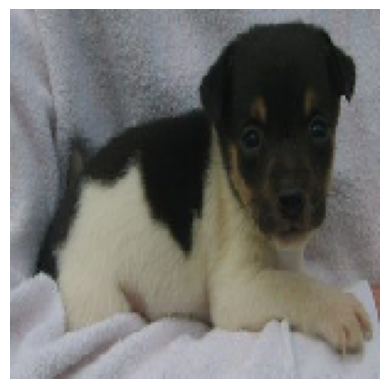

Label:  dog
Previsão:  dog
Probabilidade:  0.5560522


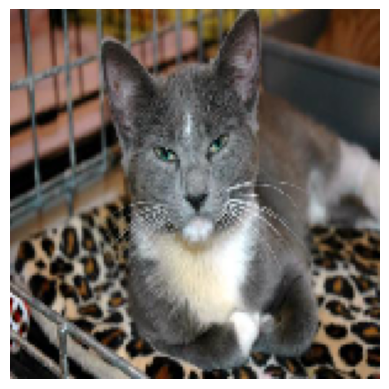

Label:  cat
Previsão:  dog
Probabilidade:  0.5858098


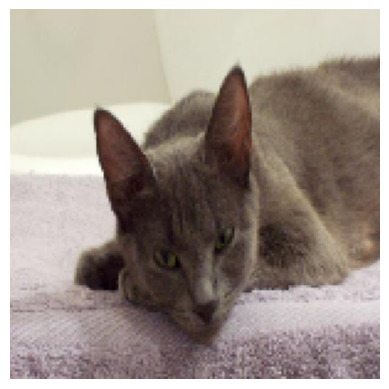

Label:  cat
Previsão:  dog
Probabilidade:  0.59784085


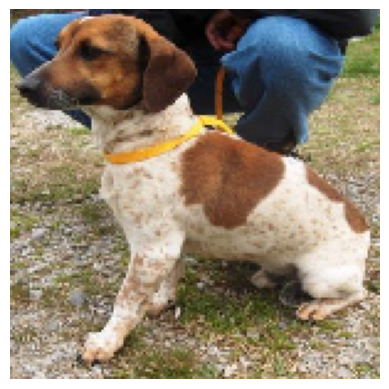

Label:  dog
Previsão:  dog
Probabilidade:  0.5984678


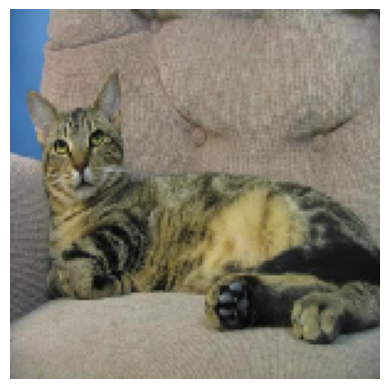

Label:  cat
Previsão:  dog
Probabilidade:  0.5792805


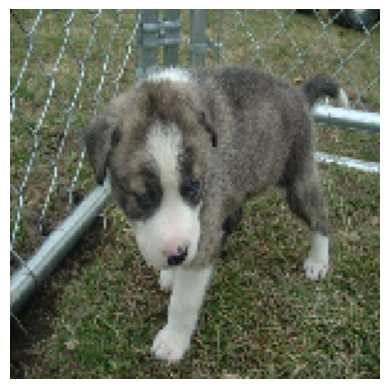

Label:  dog
Previsão:  dog
Probabilidade:  0.59834564


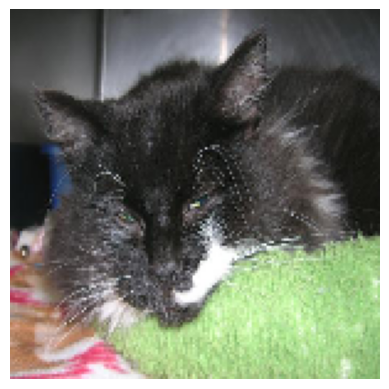

Label:  cat
Previsão:  dog
Probabilidade:  0.6129529


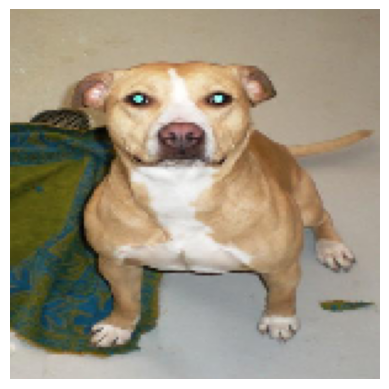

Label:  dog
Previsão:  dog
Probabilidade:  0.58414066


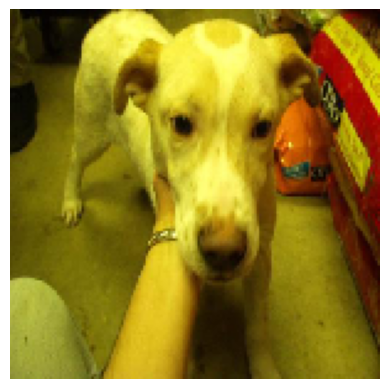

Label:  dog
Previsão:  dog
Probabilidade:  0.6286513


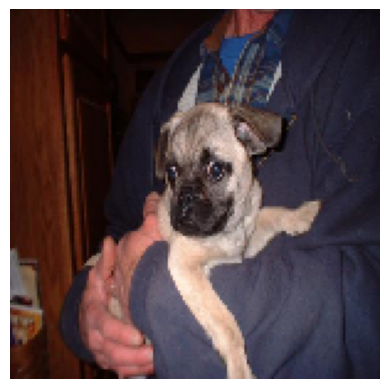

Label:  dog
Previsão:  dog
Probabilidade:  0.50538784


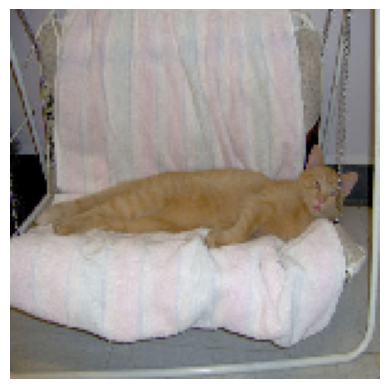

Label:  cat
Previsão:  dog
Probabilidade:  0.5590862


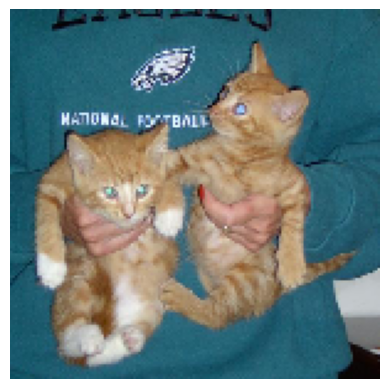

Label:  cat
Previsão:  dog
Probabilidade:  0.6023837


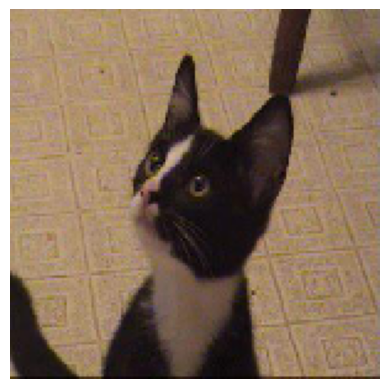

Label:  cat
Previsão:  dog
Probabilidade:  0.591753


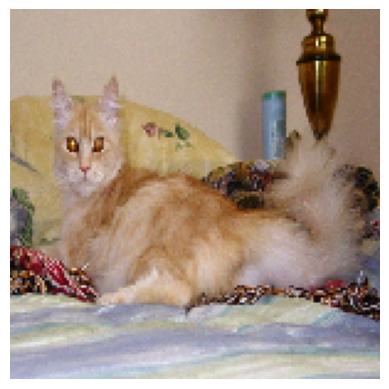

Label:  cat
Previsão:  dog
Probabilidade:  0.57529


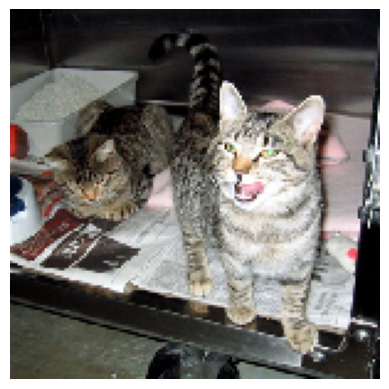

Label:  cat
Previsão:  dog
Probabilidade:  0.5939508


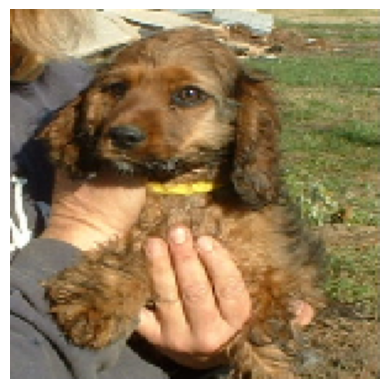

Label:  dog
Previsão:  dog
Probabilidade:  0.6092974


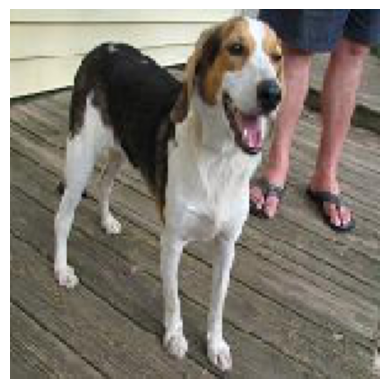

Label:  dog
Previsão:  dog
Probabilidade:  0.6118837


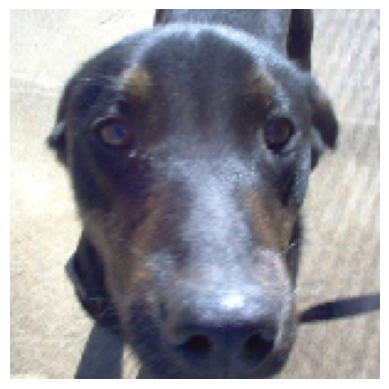

Label:  dog
Previsão:  dog
Probabilidade:  0.5882054


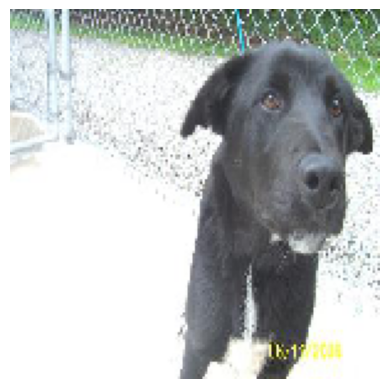

Label:  dog
Previsão:  dog
Probabilidade:  0.6044896


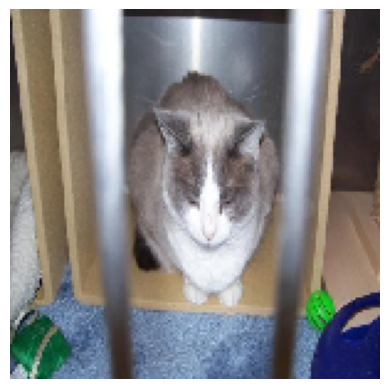

Label:  cat
Previsão:  dog
Probabilidade:  0.5943228


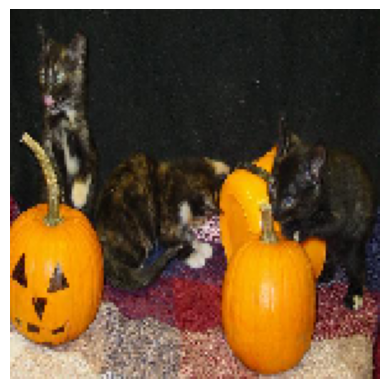

Label:  cat
Previsão:  dog
Probabilidade:  0.5339411


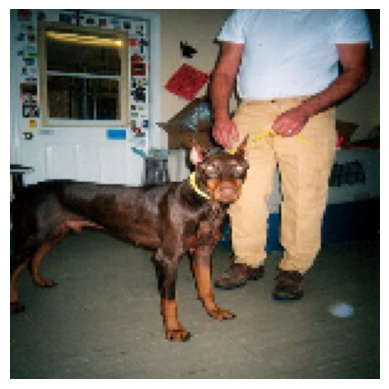

Label:  dog
Previsão:  dog
Probabilidade:  0.6386442


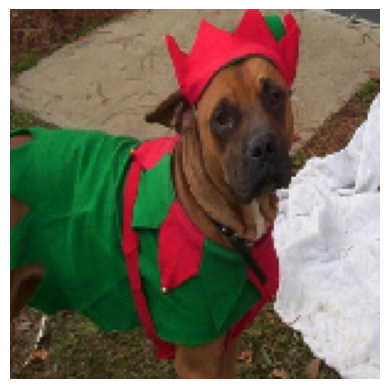

Label:  dog
Previsão:  dog
Probabilidade:  0.57212955


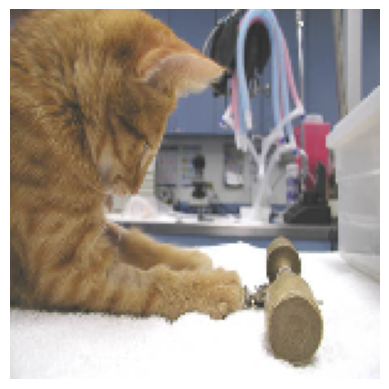

Label:  cat
Previsão:  dog
Probabilidade:  0.59961015


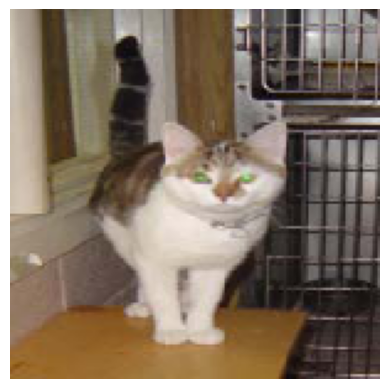

Label:  cat
Previsão:  dog
Probabilidade:  0.5889768


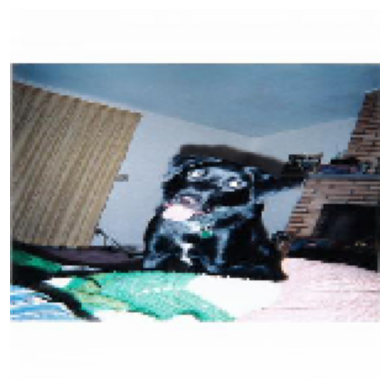

Label:  dog
Previsão:  dog
Probabilidade:  0.6826925


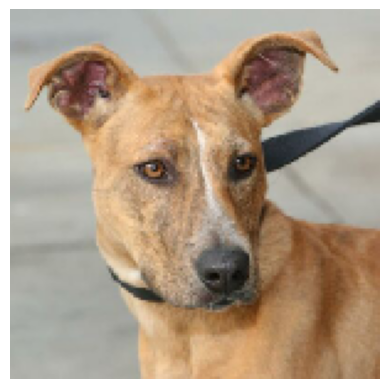

Label:  dog
Previsão:  dog
Probabilidade:  0.59322864


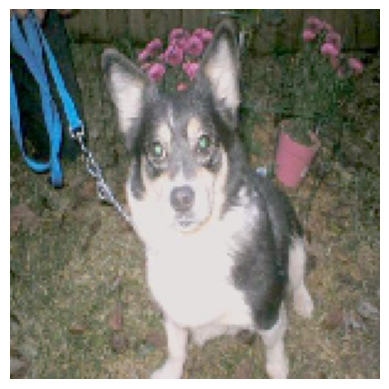

Label:  dog
Previsão:  dog
Probabilidade:  0.576302


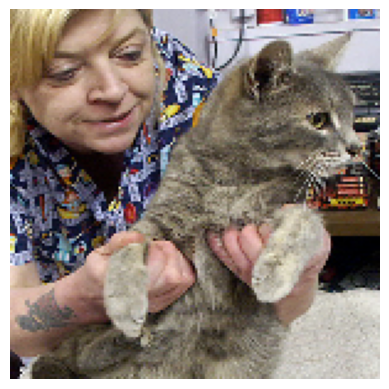

Label:  cat
Previsão:  dog
Probabilidade:  0.6471629


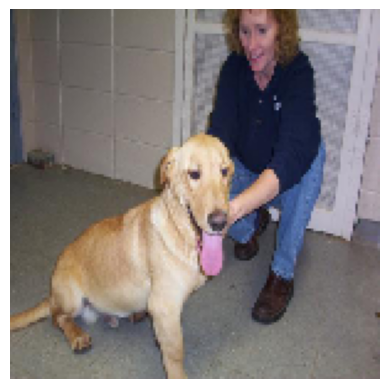

Label:  dog
Previsão:  dog
Probabilidade:  0.60314584


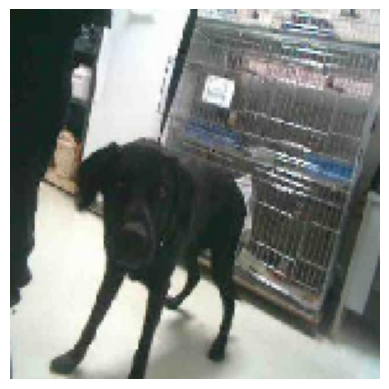

Label:  dog
Previsão:  dog
Probabilidade:  0.622029


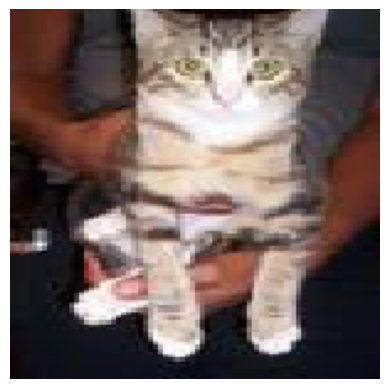

Label:  cat
Previsão:  dog
Probabilidade:  0.5509611


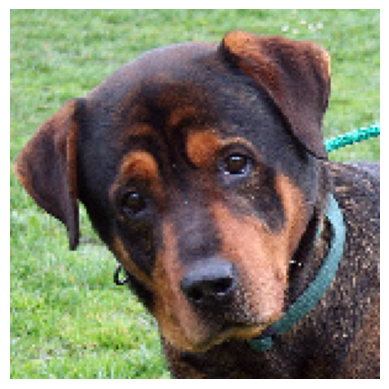

Label:  dog
Previsão:  dog
Probabilidade:  0.62540305


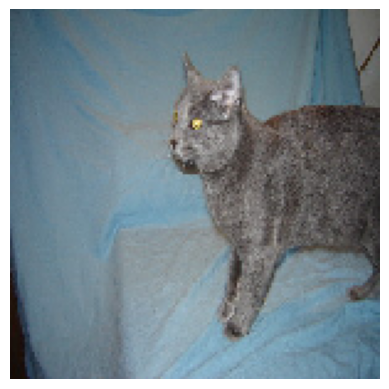

Label:  cat
Previsão:  dog
Probabilidade:  0.5799327


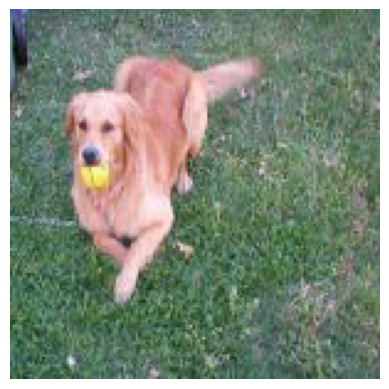

Label:  dog
Previsão:  dog
Probabilidade:  0.59833014


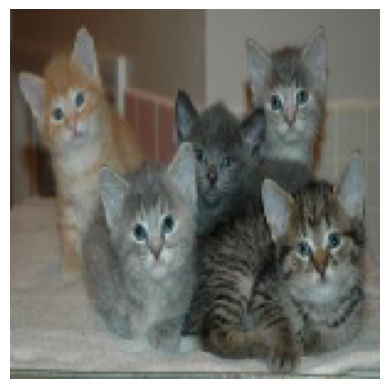

Label:  cat
Previsão:  dog
Probabilidade:  0.58055496


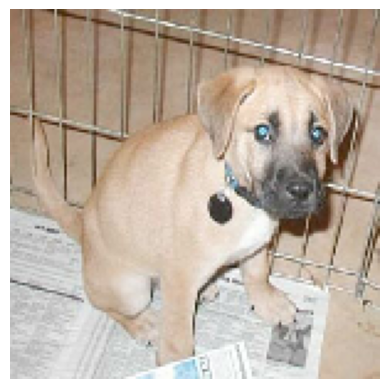

Label:  dog
Previsão:  dog
Probabilidade:  0.5925351


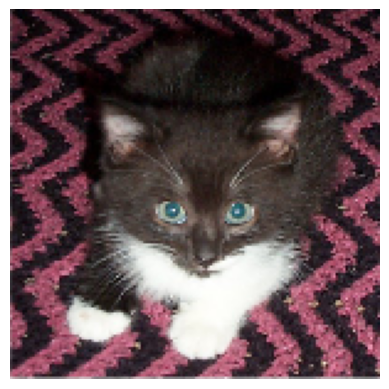

Label:  cat
Previsão:  dog
Probabilidade:  0.50901544


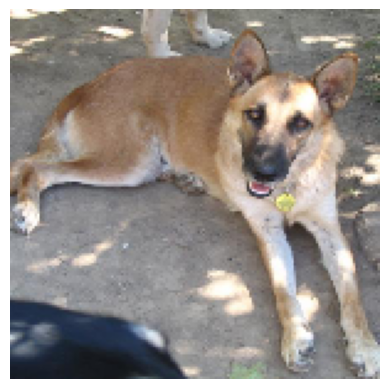

Label:  dog
Previsão:  dog
Probabilidade:  0.5769721


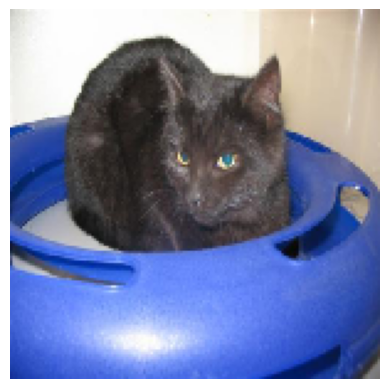

Label:  cat
Previsão:  dog
Probabilidade:  0.60776484


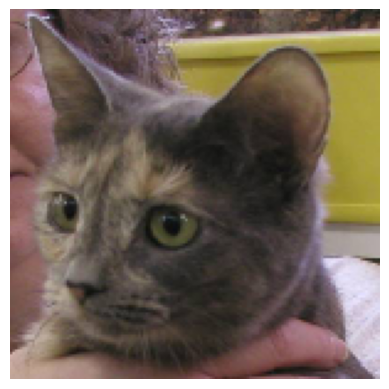

Label:  cat
Previsão:  dog
Probabilidade:  0.55636245


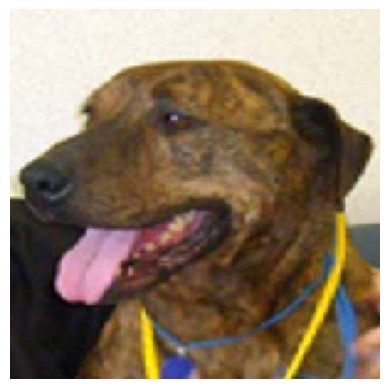

Label:  dog
Previsão:  dog
Probabilidade:  0.5616305


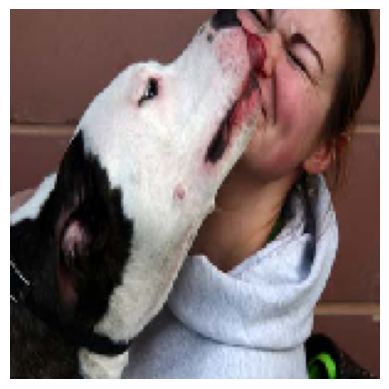

Label:  dog
Previsão:  dog
Probabilidade:  0.5806118


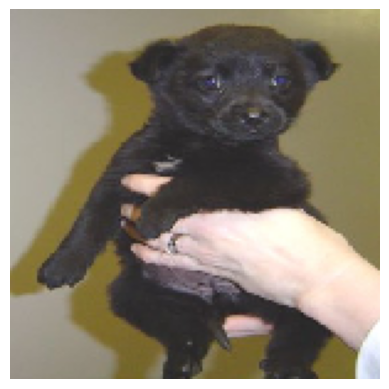

Label:  dog
Previsão:  dog
Probabilidade:  0.58990526


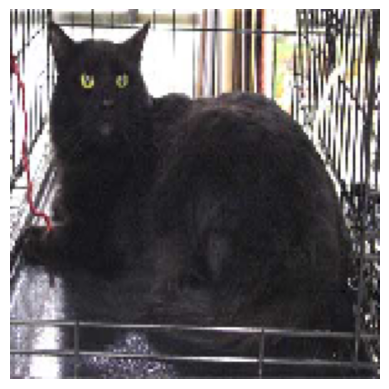

Label:  cat
Previsão:  dog
Probabilidade:  0.5341994


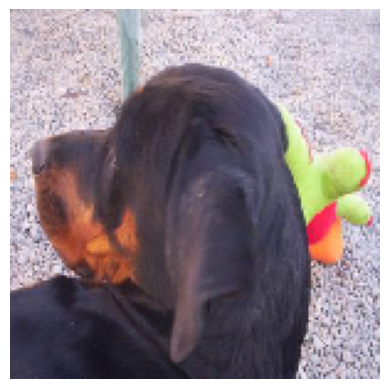

Label:  dog
Previsão:  dog
Probabilidade:  0.5543885


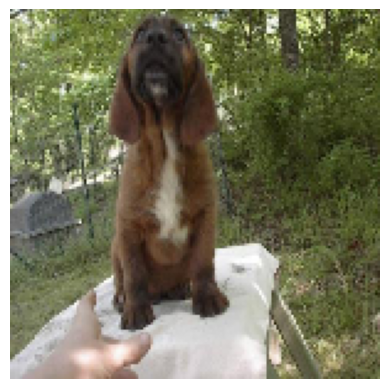

Label:  dog
Previsão:  dog
Probabilidade:  0.59820366


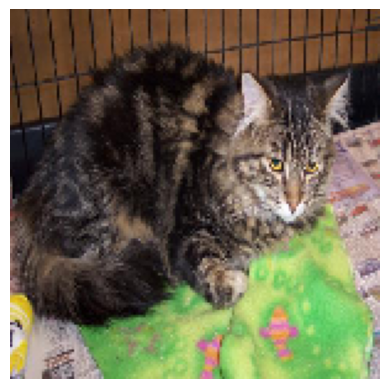

Label:  cat
Previsão:  dog
Probabilidade:  0.58680296


In [50]:
count = 0
y_pred = list()
y_true = list()
class_names = ['cat', 'dog']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'dog' if prediction >= 0.5 else 'cat'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

## 6. Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste

In [51]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-51-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.503962  ;  loss = 0.696559 


#### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [53]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.54
Precision:  0.2916
Recall:  0.54
F1 Score:  0.3787012987012987


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

Matriz de confusão sem normalização


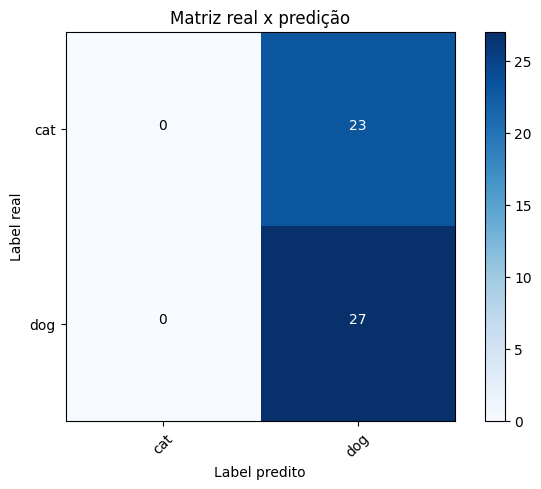

In [54]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['cat',
                               'dog'],
                      normalize= False,
                      title='Matriz real x predição')

## 7. Exportação do modelo de deep learning para posterior uso

Salvando o modelo de deep learning que foi treinado

In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/dogs_vs_cats/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-06-19T1422.h5


## 8. Teste do modelo exportado

Carregando o modelo salvo

In [ ]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-06-19T1422.h5 carregado com sucesso


Execução do modelo em um subconjunto de imagens de teste

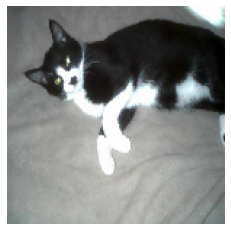

Label:  cat
Previsão:  cat
Probabilidade:  0.3978519


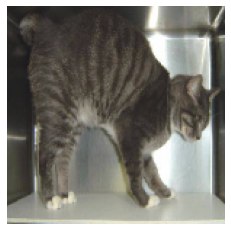

Label:  cat
Previsão:  cat
Probabilidade:  0.47844887


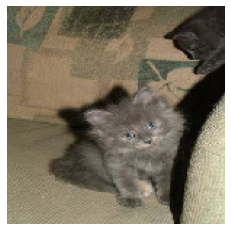

Label:  cat
Previsão:  dog
Probabilidade:  0.5011839


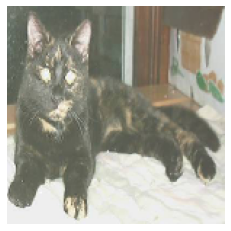

Label:  cat
Previsão:  dog
Probabilidade:  0.59101564


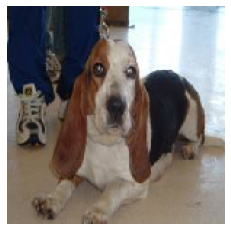

Label:  dog
Previsão:  cat
Probabilidade:  0.46721667


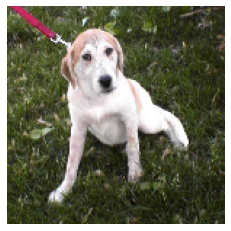

Label:  dog
Previsão:  dog
Probabilidade:  0.8005172


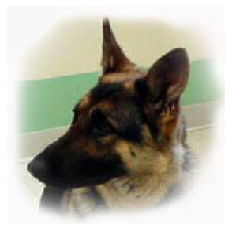

Label:  dog
Previsão:  cat
Probabilidade:  0.42128876


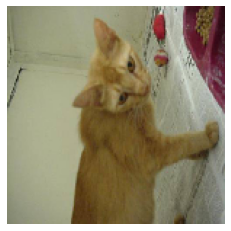

Label:  cat
Previsão:  dog
Probabilidade:  0.5772306


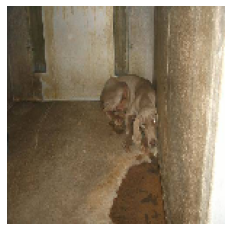

Label:  dog
Previsão:  cat
Probabilidade:  0.4672549


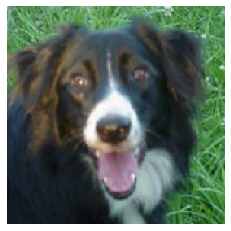

Label:  dog
Previsão:  dog
Probabilidade:  0.52738994


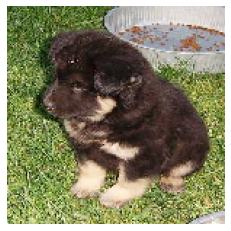

Label:  dog
Previsão:  dog
Probabilidade:  0.9287647


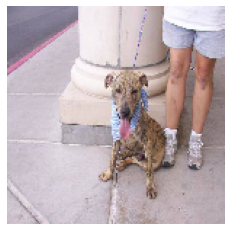

Label:  dog
Previsão:  cat
Probabilidade:  0.46095905


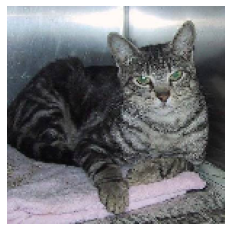

Label:  cat
Previsão:  dog
Probabilidade:  0.50045866


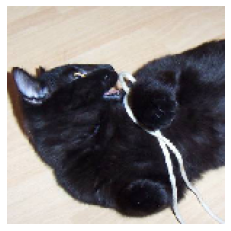

Label:  cat
Previsão:  cat
Probabilidade:  0.4330256


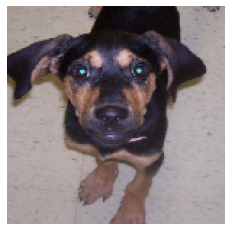

Label:  dog
Previsão:  cat
Probabilidade:  0.43730694


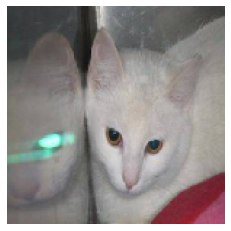

Label:  cat
Previsão:  cat
Probabilidade:  0.4694085


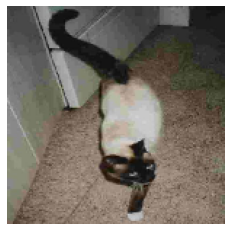

Label:  cat
Previsão:  cat
Probabilidade:  0.480064


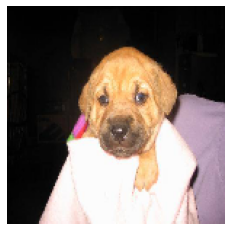

Label:  dog
Previsão:  cat
Probabilidade:  0.3451091


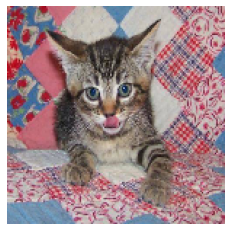

Label:  cat
Previsão:  cat
Probabilidade:  0.48407996


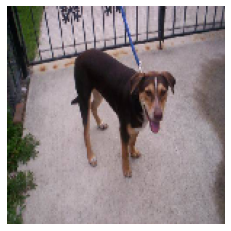

Label:  dog
Previsão:  cat
Probabilidade:  0.44200101


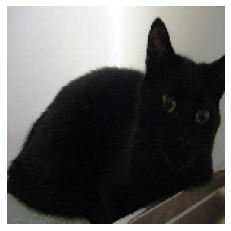

Label:  cat
Previsão:  cat
Probabilidade:  0.16258049


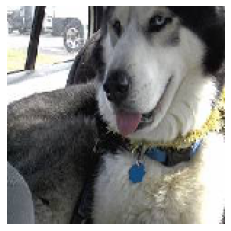

Label:  dog
Previsão:  cat
Probabilidade:  0.4847297


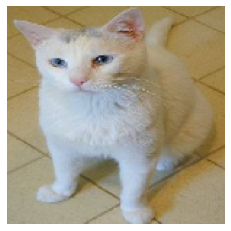

Label:  cat
Previsão:  dog
Probabilidade:  0.51663476


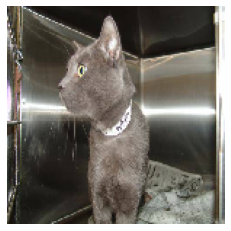

Label:  cat
Previsão:  cat
Probabilidade:  0.40918538


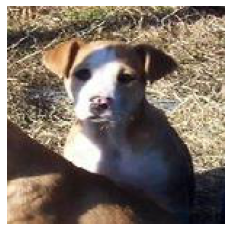

Label:  dog
Previsão:  dog
Probabilidade:  0.650263


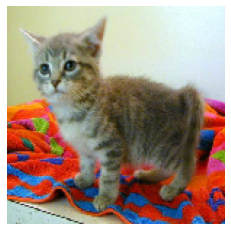

Label:  cat
Previsão:  dog
Probabilidade:  0.6455486


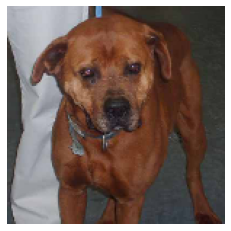

Label:  dog
Previsão:  cat
Probabilidade:  0.4777929


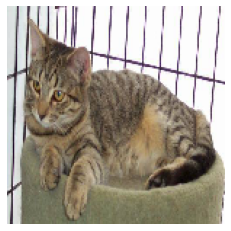

Label:  cat
Previsão:  dog
Probabilidade:  0.66730034


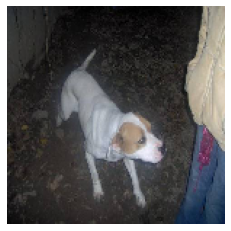

Label:  dog
Previsão:  cat
Probabilidade:  0.4206469


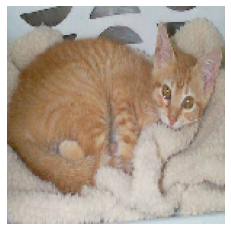

Label:  cat
Previsão:  dog
Probabilidade:  0.5010192


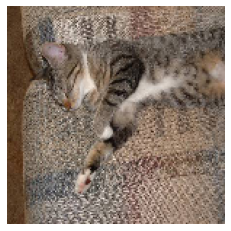

Label:  cat
Previsão:  dog
Probabilidade:  0.73328197


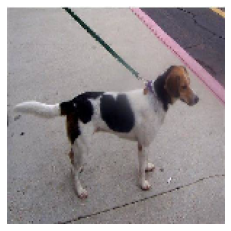

Label:  dog
Previsão:  cat
Probabilidade:  0.44966856


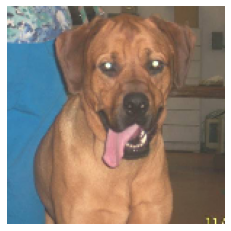

Label:  dog
Previsão:  cat
Probabilidade:  0.47386783


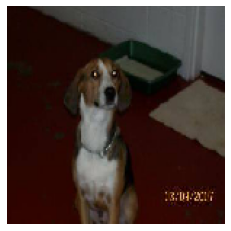

Label:  dog
Previsão:  cat
Probabilidade:  0.28345662


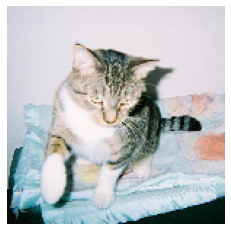

Label:  cat
Previsão:  cat
Probabilidade:  0.47410855


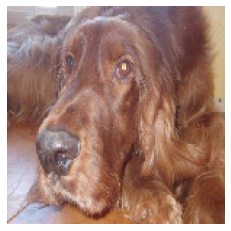

Label:  dog
Previsão:  cat
Probabilidade:  0.47391877


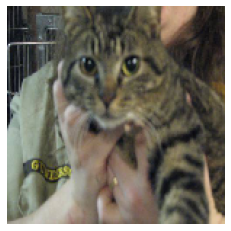

Label:  cat
Previsão:  dog
Probabilidade:  0.5494716


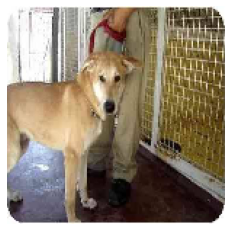

Label:  dog
Previsão:  dog
Probabilidade:  0.52756244


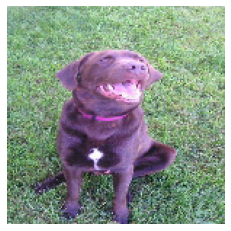

Label:  dog
Previsão:  dog
Probabilidade:  0.8700666


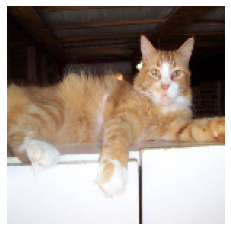

Label:  cat
Previsão:  cat
Probabilidade:  0.46351114


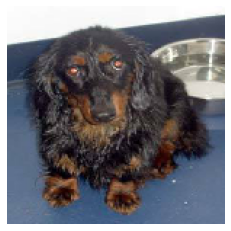

Label:  dog
Previsão:  cat
Probabilidade:  0.49228406


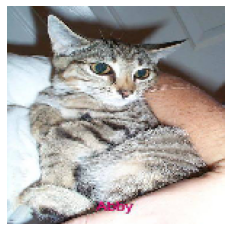

Label:  cat
Previsão:  dog
Probabilidade:  0.6132242


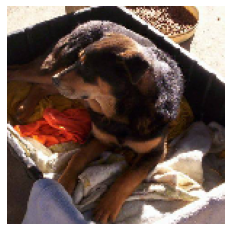

Label:  dog
Previsão:  dog
Probabilidade:  0.58233666


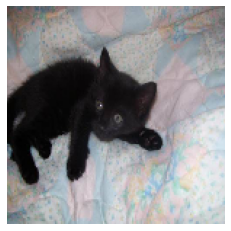

Label:  cat
Previsão:  cat
Probabilidade:  0.42871666


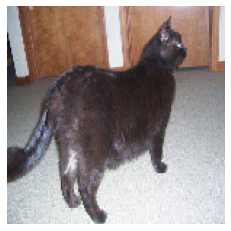

Label:  cat
Previsão:  dog
Probabilidade:  0.5090013


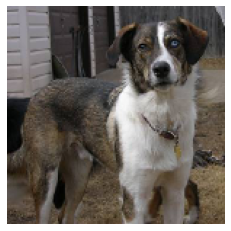

Label:  dog
Previsão:  cat
Probabilidade:  0.44871888


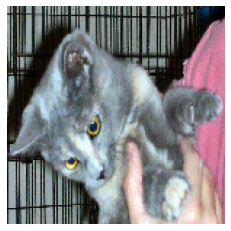

Label:  cat
Previsão:  dog
Probabilidade:  0.6953757


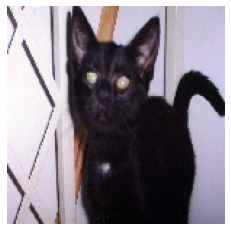

Label:  cat
Previsão:  cat
Probabilidade:  0.35310245


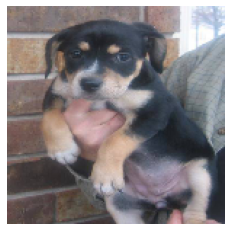

Label:  dog
Previsão:  cat
Probabilidade:  0.43995315


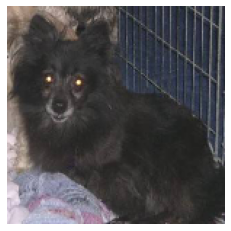

Label:  dog
Previsão:  cat
Probabilidade:  0.3872382


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['cat', 'dog']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'dog' if prediction >= 0.5 else 'cat'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)